# Github Repository Link

https://github.com/frankfan6969/Pic-16B-Project.git

# Section I - Database (crime_db.py)

Let's take a look at our package's functions for creating and querying a crime database.

<h4> Warning: In this project, We ONLY incorporate LA crime data from 2010 to 2023, Please DO NOT query data outside of this range

### Classification Functions

Before we append dataframes to our future database, we will want to perform some data cleaning so that the data we access through query functions is readable and has information relevant to the rest of our package's functions. To do this, we will start off by defining 3 classification functions that categorize data such as age and crime risk under distinct labels. Each of these functions can be found in the crime_db.py file under a private class called "_classify".

The first classifier function categorizes the time that the crime occurred into a "crime period" of morning, afternoon, evening, or night.

```{python}
def crime_period(x):
        '''
        Takes in time occurred as a string, uses the datetime library to classify the time 
        into one of four categories, and then returns the category name as a string.
        '''
```

The second classifier function categorizes the age of the victim into a "victim age group" of child, young adult, adult, older adult, or senior.

```{python}
 def victim_age_group(x):
        '''
        Takes in the crime victim's age as an integer, classifies it into an age group,
        and then returns the name of the age group as a string.
        '''
```

The third and final classifier function categorizes the crime code of the crime into a "risk" category of serious, medium, or light. In this case, crime codes of a lower numerical value correspond to more severe crimes.

```{python}
def risk(x):
        '''
        Takes in the crime's code as an integer, classifies it based on severity,
        and then returns the risk level as a string.
        '''
```

### Dataframe Preparation 

With our classification functions ready, we can now write our dataframe preparation function prepare_df. This function essentially takes in raw data in dataframe form and cleans it so that it's ready to be added to our database. It also makes use of our classification functions to perform transform operations on each dataframe. 

```{python}
def prepare_df(df): 
        '''
        Takes in a dataframe, performs several data cleaning and transformation operations,
        and then returns the modified data frame.
        '''
```

### Database Creation

Now we can create our database. The create_db function reads in each .csv file as a dataframe, iterates through all of the file's data and applies the prepare_df function to all the data before appending it to the database. 

```{python}
def create_db():
    '''
    Creates a new database by opening a connection, reads csv files in as pandas dataframes, 
    cleans the data, feeds the data into the database, and finally closes the database
    connection.
    '''
```

Below is an example of the create_db function being used. Of course, we will need to import the crime_db module before calling the function.

In [1]:
from LA_crime_predictor import crime_db as cdb 

cdb.create_db()

Calling this function will create a database with official LA crime data from 2010-present in the same directory as the jupyter notebook where it is called. The database's location should not be changed.

### Query Functions

Now that we have a functional database, we can create some query functions using SQL. These functions will allow us to retrieve specific data from our database given certain parameters. 

The query_address function searches near an address provided by the user for crimes that occurred in the past two full years (2021-2022). We limit this query function to recent data so that predictions made with data from it are more accurate. 

```{python}
def query_address(address): 
    '''
    Takes in an address as a string, opens a database connection, converts the address 
    to its latitude and longitude coordinates using the geopy library, returns 
    a dataframe containing all crimes that occurred near the address from 2021-2022,
    and finally closes the database connection.
    '''
```

Here is an example of the function being used:

In [2]:
cdb.query_address("200 BRONWOOD AV")

,DATE OCC,TIME OCC,Crime Period,AREA NAME,Crm Cd,Risk,Crm Cd Desc,Vict Age,Vict Age Group,Vict Sex,LOCATION,LAT,LON,year
0,01/01/2021 12:00:00 AM,08:00:00.000000,morning,West LA,354,Medium,THEFT OF IDENTITY,51,older adult,F,Female,34.0646,-118.4707,2021
1,01/03/2021 12:00:00 AM,00:11:00.000000,night,West LA,354,Medium,THEFT OF IDENTITY,56,older adult,F,Female,34.0813,-118.4726,2021
2,01/03/2021 12:00:00 AM,19:40:00.000000,evening,West LA,940,Light,EXTORTION,24,young adult,M,Male,34.0634,-118.4686,2021
3,01/04/2021 12:00:00 AM,05:20:00.000000,morning,West LA,310,Medium,BURGLARY,47,older adult,M,Male,34.0819,-118.4719,2021
4,01/05/2021 12:00:00 AM,10:00:00.000000,morning,West LA,930,Light,CRIMINAL THREATS - NO WEAPON DISPLAYED,71,senior,F,Female,34.0668,-118.4711,2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
450,12/25/2022 12:00:00 AM,21:00:00.000000,night,West LA,740,Light,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",54,older adult,M,Male,34.0731,-118.4681,2022
451,12/27/2022 12:00:00 AM,18:00:00.000000,evening,West LA,310,Medium,BURGLARY,65,senior,M,Male,34.0744,-118.4584,2022
452,12/29/2022 12:00:00 AM,12:00:00.000000,afternoon,West LA,740,Light,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",29,young adult,M,Male,34.0673,-118.4612,2022
453,12/30/2022 12:00:00 AM,19:51:00.000000,evening,West LA,310,Medium,BURGLARY,51,older adult,F,Female,34.0692,-118.4640,2022


The query_years function searches the database for all crimes that occurred between and during the years input by the user. 

```{python}
def query_years(year_begin, year_end):
    '''
    Takes in a beginning year and end year as integers, opens a database connection,
    returns a dataframe of all crimes that occurred during and between the start and
    end years, then closes the databse connection.
    '''

```

Let's test this function out:

In [3]:
cdb.query_years(2018,2020)

,DATE OCC,TIME OCC,Crime Period,AREA NAME,Crm Cd,Risk,Crm Cd Desc,Vict Age,Vict Age Group,Vict Sex,LOCATION,LAT,LON,year
0,01/01/2018 12:00:00 AM,12:00:00.000000,afternoon,Southwest,821,Light,SODOMY/SEXUAL CONTACT B/W PENIS OF ONE PERS TO...,9,child,F,Female,34.0132,-118.3457,2018
1,01/01/2018 12:00:00 AM,13:00:00.000000,afternoon,Newton,624,Light,BATTERY - SIMPLE ASSAULT,37,adult,F,Female,34.0039,-118.2434,2018
2,01/01/2018 12:00:00 AM,00:05:00.000000,night,West LA,354,Medium,THEFT OF IDENTITY,35,adult,F,Female,34.0661,-118.4868,2018
3,01/01/2018 12:00:00 AM,14:30:00.000000,afternoon,Wilshire,626,Light,INTIMATE PARTNER - SIMPLE ASSAULT,21,young adult,F,Female,34.0449,-118.3411,2018
4,01/01/2018 12:00:00 AM,22:00:00.000000,night,Hollenbeck,812,Light,CRM AGNST CHLD (13 OR UNDER) (14-15 & SUSP 10 ...,7,child,F,Female,34.0767,-118.1937,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
647783,12/31/2020 12:00:00 AM,12:00:00.000000,afternoon,N Hollywood,420,Medium,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),0,child,None,Unknown,34.1776,-118.3889,2020
647784,12/31/2020 12:00:00 AM,08:00:00.000000,morning,Olympic,624,Light,BATTERY - SIMPLE ASSAULT,33,adult,M,Male,34.0690,-118.3029,2020
647785,12/31/2020 12:00:00 AM,05:00:00.000000,morning,Olympic,745,Light,VANDALISM - MISDEAMEANOR ($399 OR UNDER),28,young adult,M,Male,34.0690,-118.3029,2020
647786,12/31/2020 12:00:00 AM,12:00:00.000000,afternoon,West Valley,354,Medium,THEFT OF IDENTITY,62,senior,F,Female,34.1749,-118.5337,2020


### Summary 

This module contains three relevant functions: <br>

    1. create_db(), which creates the crime database <br>
    2. query_address(), which allows the user to search near an address for crimes <br>
    3. query_years(), which allows the user to search for crimes that occurred during certain years
    
<b> In summation, this module is the foundation of the package, as it allows the user to create and query an LA crime database. 

# Section II - Introduction (crime_plots.py)
Crimes are most people's significant concern and could influence their well-beings. In the ever-evolving landscape of urban safety and law enforcement, the integration of advanced technologies has become imperative to enhance the effectiveness of crime prevention. In this project, we will get to know how to use data analytics and machine learning techniques to better forecast the likelihood and the crime type that's happening in our neighborhood. 

In [7]:
import warnings
warnings.filterwarnings('ignore')

Firstly, we will do some basic data visualization to display the crime layout in LA. This is handles by the  "crime_plots"  package inside the util module.
Here we will import the pacakage

In [8]:
from LA_crime_predictor import crime_plots as cp

Below is a list of functionalities we can explore:
- Count crime total instances by year
- Count crime instances based on different periods of the day
- Count crime instances based on age group
- Count crime instances based on sex
- Crime instances geographical plot

In which all the parameters passed in are year_begin and year_end, in which we specify the range of the data to explore

Note: Examples Below Select year_begin = 2021 and year_end = 2023

Wow, 2022 shows increasing total crime instances!

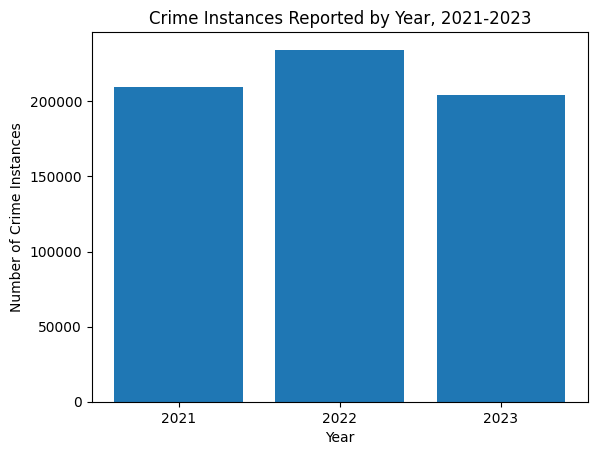

In [4]:
cp.crime_count_year(2021,2023)

It seems like Night is the period of the day where most crimes take place

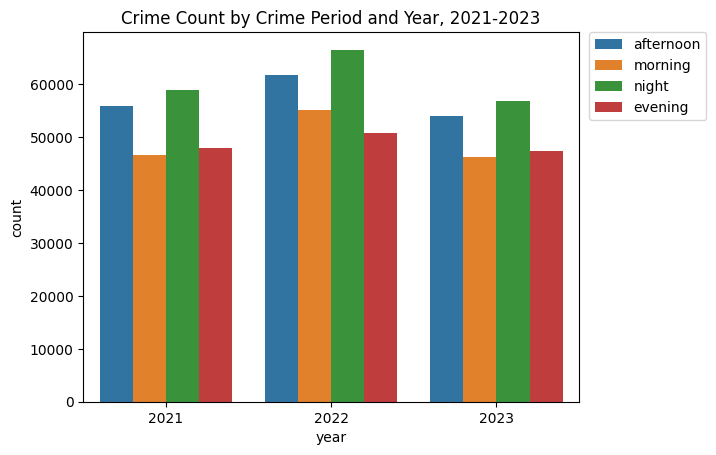

In [5]:
cp.crime_count_period(2021,2023)

Child and Adult are the most commonly attacked Age Group!

In [6]:
cp.crime_count_age(2021,2023)

Among the sex distribution, males are the most common!

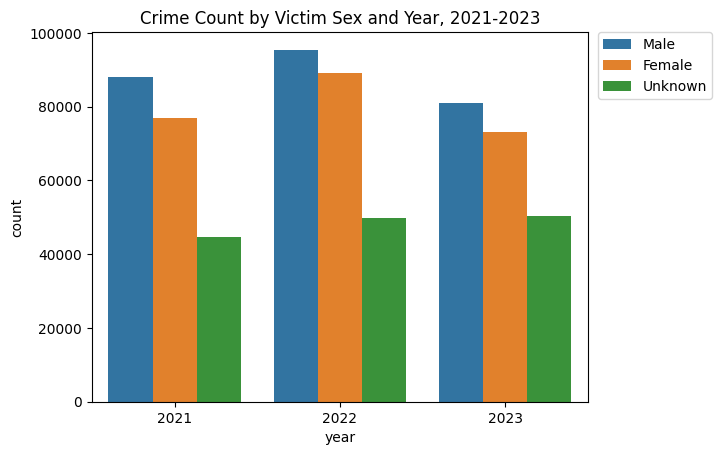

In [7]:
cp.crime_count_sex(2021,2023)

Here we just show the plot of 2023

In [9]:
cp.crime_map(2023,2023)

# Section III - Probability (crime_prob.py)

This module focuses on calculating the average number of crimes per day in a given area and leveraging that information to visualize different probability distributuons of crime occurrence. 

### Calculating Lambda (λ)

Lambda is a variable representing the average number of events we expect to occur in a given period of time. In this case, the event we are looking at is a crime instance and the period of time is a day. This gives us some information about crime likelihood on its own, but lambda is also a parameter for two different probability distributions that we will examine later. 

```{python}
def calc_lambda(address):
    '''
    Takes in an address as a string, calls the query_address function with the address
    as a parameter, counts the number of crimes in the query, and then calculates lambda
    for the query.
    '''
```

Let's try this function out after importing the crime_prob module:

In [4]:
from LA_crime_predictor import crime_prob as cpb

cpb.calc_lambda("200 BRONWOOD AV")

0.6233

As mentioned earlier, this result can be interpreted in the following way: "Based on data from 2021-2022, we expect 0.6233 crimes to occur per day in the area surrounding the given address (200 Bronwood Av)."

### The Poisson Distribution

The Poisson distribution describes the expected number of events occurring in a unit of time. In our case, plotting the Poisson distribution with lambda as its parameter will produce a visualization of the probabilities of different numbers of crimes occurring on a given day. It is worth noting that the Poisson distribution is a discrete function with mean λ.

```{pyhton}
def plot_poisson(address):
    '''
    Takes in an address as a string, calls the calc_lambda function with the address as
    the parameter, creates a numpy array for the x-axis and then a y-value for each x according
    to the Poisson probability distribution. Finally, plots the x and y values using 
    matplotlib and adds labels to the plot.
    '''
```

Let's test out our Poisson visualization:

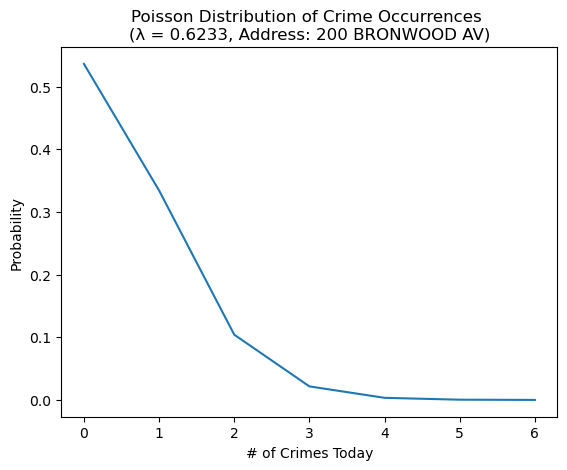

In [5]:
cpb.plot_poisson("200 BRONWOOD AV")

Interpretation: By examining this figure, we can conclude that the most likely outcome is that no crimes occur today around the given address with a probability of about 53%. Following this logic, we can say there is about a 35% chance of exactly 1 crime occuring, about a 10% chance of exactly 2 crimes occurring and so on. 

### The Exponential Distribution

The Exponential disitrbution describes the time elapsed between occurrences of an event. In our case, it will help us visualize the probabilities of different amounts of time (in days) passing between crime instances. The Exponential distribution is a continuous function wtih mean 1/λ.

```{python}
def plot_expon(address):
    '''
    Takes in an address as a string, calls the calc_lambda function with the address as
    the parameter, creates a numpy array for the x-axis and then a y-value for each x according
    to the exponential probability distribution. Finally, plots the x and y values using 
    matplotlib and adds labels to the plot.
    '''
```

Below we can see an example of the plotting function being used:

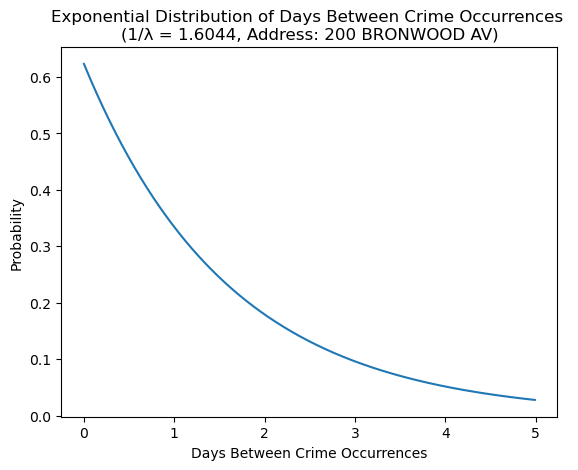

In [6]:
cpb.plot_expon("200 BRONWOOD AV")

Interpretation: This figure tells us that there is about a 35% chance of exactly one day passing between crimes occuring in the vicinity of the given address. We can also say there is about a 20% chance of exactly 2 days passing between crimes and so on.

### Summary

This module contains three relevant functions: <br>

    1. calc_lambda(), which calculates the lambda parameter (average rate of crime occurrence per day) <br>
    2. plot_poisson(), which plots a Poisson distrbituion with λ as its parameter and mean <br> 
    3. plot_expon(), which plots an Exponential distribution with 1/λ as its parameter and mean <br>
    
<b> In summation, this module provides the user with several different probability-based tools to predict the likelihood of crime occurrence.

# Section IV - Machine Learning (ML.py)
- In this Section, the primary goal is to <b> predict what type of crime(Light, Medium, or Serious) is likely if there will be a crime
- We will use our machine learning modules to help with the task, let's first import it!

In [9]:
from LA_crime_predictor import ML as ml

In this Package, there are 3 functionalities that we can explore:
- training a model
- testing a model
- use the model to predict the type of crime

Let's Explore the first functionality of training a model, with it's declaration shown below


```{python} 
def train_model(year_begin, year_end, target_month):
    '''
    Takes in a beginning year and end year as integers, opens a database connection,
    returns a trained model using Random Forest of depth 12 using data from this period.
    We will only look at data with the same month as the target_month.

    The Returned Model aims to predict the type of crime given "Crime Period", "Vict Age Group","LAT", "LON" as input

    Parameters
    ----------
    year_begin : int
        the first year the user would like to query
    year_end : int
        the final year the user would like to query
    target_month: int
        the month the user would like to investigate

    Returns
    -------
    (Trained Random Forest Model of Depth 12, training score on the data)
    '''
```


Remark on the ML model
- the train_model function will train data ONLY on a specific month since we find out that looking at data of the whole year is very noisy and the variance of the data will be high. 
- the train_model function will use Random Forest with depth of 12 as the classifier as it is experimented to be the most effective model

In the below example, I trained a model using January Data from 2017 to 2018 <br>
It turns out that the Random Forest model is able to achieve a train accuracy of 68.5%

In [3]:
forest, score = ml.train_model(2017,2018,1)
print(forest,score)

RandomForestClassifier(max_depth=12) 0.6847743311164136


After we get a trained model, we can test it to see how well it can perform, in which naturally leads us to explore the second functionality defined below


```{python} 
def test_model(clf, target_year, target_month):
    '''
    Parameters
    ----------
    clf: a ML model that you just finished training by using train_model function
    target_year: int, the year you would like your model to be tested on
    target_month: int, the month you would like your model to be tested on

    Note: target_month should be the same as the target month you trained the model on, 
    otherwise the result will not guaranteed to be indicative

    Returns
    -------
    accuracy score when applied the model to the test data
    '''
```


- Below, we put in the forest model we just trained, and test it on January data in 2019 <br>
- <b> As noted in the function, target_month should be the same as the target month you trained the model on, otherwise the result will not guaranteed to be indicative because of high variance of data among different months as mentiond below

It turns out the model is able to achieve a test accuracy 54% of the time

In [4]:
a = ml.test_model(forest, 2019, 1)
a

0.5436586541035388

Last but not least, we can use the model to make predictions based on the users information as shown below

```{python} 
def predict_crime_type(clf, crime_period, age_group, LAT, LON):
    '''
    Parameters
    ----------
    clf: a ML model that you just finished training by using train_model function
    crime_period: string, the current period of the day the user is in
    age_group: int, the age group the user belongs to
    LAT: int, the current latitude of the user
    LON: int, the current longitude of the user

    Note: In Practice, We can get LAT and LON using GPS without manually input the data

    Returns
    -------
    the predicted crime type to the user if there is any
    '''
```

There are a few limitations to note on the input format of the arguments:
- crime_period should be one of the following categories: "morning", "afternoon", "evening", "night"
- age_group should be one of the following categories: "child", "young adult", "adult", "older adult", "senior"

Now, let's use our model to predict what type of crime an adult is likely to encounter at night around Westwood BLVD

In [5]:
# West LA --> Westwood BLVD
ml.predict_crime_type(forest, "night", "adult", 34.0554, -118.4418)


array(['Medium'], dtype=object)

# Section V - Neural Network (NN.py)
- Another popular way to capture the complex pattern in a dataset is by deep learning neural network
- In this Section, the primary goal is to <b> predict what type of crime(Light, Medium, or Serious) is likely if there will be a crime
- We will use out Neural Network modules to help with the task, let's first import it!

In [2]:
from LA_crime_predictor import NN

In this Package, there are 2 functionalities that we can explore:
- training a model
- testing a model

Let's Explore the first functionality of training a model, with it's declaration shown below


```{python} 
def train_model(year_begin, year_end, target_month):
    '''
    Takes in a beginning year and end year as integers, opens a database connection,
    returns a trained NN model that fits the data.
    We will only look at data with the same month as the target_month.

    The Returned Model aims to predict the type of crime given "Crime Period", "Vict Age Group","LAT", "LON" as input

    Parameters
    ----------
    year_begin : int
        the first year the user would like to query
    year_end : int
        the final year the user would like to query
    target_month: int
        the month the user would like to investigate

    Returns
    -------
    (Trained NN model, training history of the model)
    '''
```


Remark on the NN model
- Training a NN model uses exactly the same technique as used in the ML model
- The only difference is the model itself is different
- The overall structure of the model is: Convolution -> Maxpooling -> LSTM -> Dense
- For more details, please look into the pacakage to see the implementation

In the below example, I trained a model using January Data from 2017 to 2018

In [4]:
model, history = NN.train_model(2017,2018,1)

Epoch 1/50
710/710 [==============================] - 3s 2ms/step - loss: 0.9734 - accuracy: 0.4487 - val_loss: 0.9750 - val_accuracy: 0.4704
Epoch 2/50
710/710 [==============================] - 1s 2ms/step - loss: 0.9649 - accuracy: 0.4626 - val_loss: 0.9731 - val_accuracy: 0.4722
Epoch 3/50
710/710 [==============================] - 1s 2ms/step - loss: 0.9607 - accuracy: 0.4821 - val_loss: 0.9541 - val_accuracy: 0.4879
Epoch 4/50
710/710 [==============================] - 1s 2ms/step - loss: 0.9559 - accuracy: 0.4894 - val_loss: 0.9585 - val_accuracy: 0.4778
Epoch 5/50
710/710 [==============================] - 1s 2ms/step - loss: 0.9534 - accuracy: 0.4941 - val_loss: 0.9520 - val_accuracy: 0.4976
Epoch 6/50
710/710 [==============================] - 1s 2ms/step - loss: 0.9529 - accuracy: 0.4973 - val_loss: 0.9565 - val_accuracy: 0.4714
Epoch 7/50
710/710 [==============================] - 1s 2ms/step - loss: 0.9529 - accuracy: 0.4932 - val_loss: 0.9604 - val_accuracy: 0.4730
Epoch 

Let's Plot the history to visualize its performance

In [5]:
from matplotlib import pyplot as plt

It turns out that our Neural Network's accuracy stabilizes around 50%

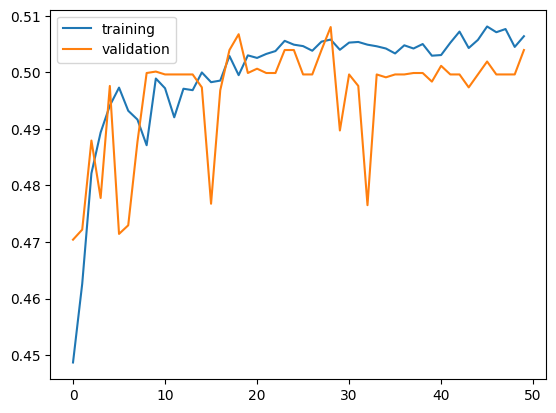

In [6]:
plt.plot(history.history["accuracy"],label='training')
plt.plot(history.history["val_accuracy"],label='validation')
plt.legend()

After we get a trained model, we can test it to see how well it can perform, in which naturally leads us to explore the second functionality defined below


```{python} 
def test_model(clf, target_year, target_month):
    '''
    Parameters
    ----------
    clf: a NN model that you just finished training by using train_model function
    target_year: int, the year you would like your model to be tested on
    target_month: int, the month you would like your model to be tested on

    Note: target_month should be the same as the target month you trained the model on, 
    otherwise the result will not guaranteed to be indicative

    Returns
    -------
    accuracy score when applied the model to the test data
    '''
```


In [7]:
NN.test_model(model, 2019, 1)

187/187 [==============================] - 0s 711us/step - loss: 0.9471 - accuracy: 0.4988


[0.9471045136451721, 0.49884897470474243]

In [8]:
NN.test_model(model, 2020, 1)

185/185 [==============================] - 0s 691us/step - loss: 0.9493 - accuracy: 0.4849


[0.9492951035499573, 0.48494186997413635]

In [9]:
NN.test_model(model, 2016, 1)

193/193 [==============================] - 0s 694us/step - loss: 0.9373 - accuracy: 0.5188


[0.9372653365135193, 0.5188443660736084]

In [10]:
NN.test_model(model, 2023, 1)

197/197 [==============================] - 0s 727us/step - loss: 0.9375 - accuracy: 0.5207


[0.9375470876693726, 0.5207112431526184]

From testing, we see that our Neural Network can sometimes reach test accuaracy of 52%, but sometimes its accuracy could be around 48% <br>
Unfortunately, this model is not as performant as our Random Forest Model, thus we will not use this model for prediction

Note: In the following section, we will stick to the ML model(Random Forest Model) to make prediction

# Section VI - Case Analysis

Let's say that Kelly, a 25 year old female is going to travel to Chick-fil-A in Westwood on December 2023. She is expecting to be in the area the entire day. What is the likelihood there is a crime nearby and what type of crime is it most likely to be?

### Crime Likelihood

To answer the first question, we can make use of our crime_prob module, more specifically the calc_lambda and plot_poisson functions. To call each of these functions, we will need the address of the restaurant: 900 Westwood Blvd. 

In [12]:
cpb.calc_lambda("900 WESTWOOD BLVD")

2.3137

So, we expect 2.3137 crimes to occur near Chick-fil-A when Kelly is in the area.

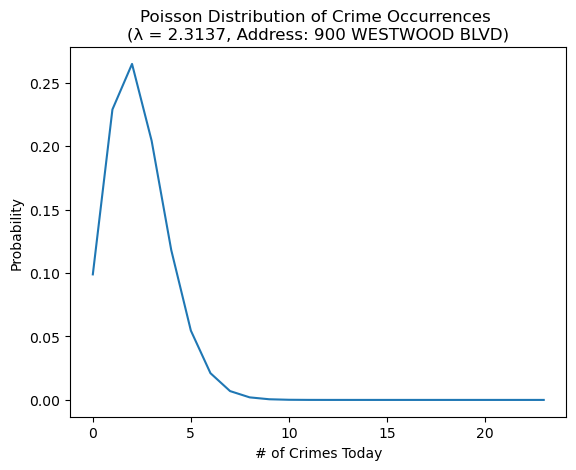

In [13]:
cpb.plot_poisson("900 WESTWOOD BLVD")

According to the Poisson distribution plot, it is most likely that exactly 2 crimes will occur near Chick-fil-A on a given day with a probability of about 27%. However, the probability of less than 2 crimes occurring is about 33% (0.1 + 0.23 = 0.33) and the probability of more than 2 crimes occuring is about 40% (1 - 0.33 - 0.27). 

### Crime Type Prediction

If there is a crime happening, the machine learning model makes a prediction that very likely this will be a medium-level crime with 68.4% accuracy

In [19]:
forest, score = ml.train_model(2021,2022,12)
print(forest,score)

RandomForestClassifier(max_depth=12) 0.6839935519674427


In [20]:
# GPS location of Westwood
ml.predict_crime_type(forest, "night", "young adult", 34.0561, -118.429)

array(['Medium'], dtype=object)

In [21]:
# GPS location of Westwood
ml.predict_crime_type(forest, "morning", "young adult", 34.0561, -118.429)

array(['Medium'], dtype=object)

In [22]:
ml.predict_crime_type(forest, "afternoon", "young adult", 34.0561, -118.429)

array(['Medium'], dtype=object)

In [23]:
ml.predict_crime_type(forest, "evening", "young adult", 34.0561, -118.429)

array(['Medium'], dtype=object)